<a href="https://colab.research.google.com/github/matbutom/maquina-de-contrapropaganda/blob/main/entrenamiento_letras.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# ============================================================
# CELDA 1: INSTALACIÓN Y PREPARACIÓN DE DATOS
# ============================================================
import os
from PIL import Image
import tensorflow as tf

print("--- 1. Clonando repositorio de GitHub ---")
# Clonar y mover las imágenes
!git clone https://github.com/matbutom/maquina-de-contrapropaganda.git
!mkdir -p /content/recortes_letras
!cp -r /content/maquina-de-contrapropaganda/recortes_letras/* /content/recortes_letras/
!rm -rf /content/maquina-de-contrapropaganda
!rm -rf ~/tensorflow_datasets/maquina_contrapropaganda # Limpiar cache de TFDS

print("\n--- 2. Redimensionando imágenes físicamente a 64x64 ---")
# Redimensionado físico con PIL
base_dir = "/content/recortes_letras"
target_size = (64, 64)
count = 0

for root, dirs, files in os.walk(base_dir):
    for f in files:
        if not f.lower().endswith((".jpg", ".jpeg", ".png")):
            continue
        path = os.path.join(root, f)
        try:
            im = Image.open(path).convert("RGB")
            im = im.resize(target_size, Image.LANCZOS)
            im.save(path)
            count += 1
        except Exception as e:
            print(f"⚠️ Error con {path} → {e}")

print(f"✅ {count} imágenes procesadas y redimensionadas a 64x64.")

--- 1. Clonando repositorio de GitHub ---
Cloning into 'maquina-de-contrapropaganda'...
remote: Enumerating objects: 37171, done.
remote: Counting objects: 100% (27/27), done.
remote: Compressing objects: 100% (27/27), done.
remote: Total 37171 (delta 15), reused 2 (delta 0), pack-reused 37144 (from 1)
Receiving objects: 100% (37171/37171), 595.13 MiB | 34.20 MiB/s, done.
Resolving deltas: 100% (4259/4259), done.
Updating files: 100% (39968/39968), done.
Filtering content: 100% (2/2), 73.62 MiB | 50.66 MiB/s, done.
Encountered 2 file(s) that should have been pointers, but weren't:
	data/metadata_clasificacion.csv
	data/metadata_letras_clasificadas.csv

--- 2. Redimensionando imágenes físicamente a 64x64 ---
✅ 10782 imágenes procesadas y redimensionadas a 64x64.


In [ ]:
# ============================================================
# CELDA 2: CARGA DEL DATASET (builder y ds) - CORREGIDA
# ============================================================
import tensorflow_datasets as tfds
import tensorflow as tf
import os

# --- Definición de la Clase de TFDS ---
class MaquinaContrapropaganda(tfds.core.GeneratorBasedBuilder):
    VERSION = tfds.core.Version('1.0.0')

    def _info(self):
        return tfds.core.DatasetInfo(
            builder=self,
            description="Dataset de letras recortadas (A-Z).",
            features=tfds.features.FeaturesDict({
                "image": tfds.features.Image(shape=(64, 64, 3)), # Forma fija
                "label": tfds.features.ClassLabel(names=[chr(i) for i in range(65, 91)])
            }),
            supervised_keys=("image", "label"),
        )

    def _split_generators(self, dl_manager):
        data_dir = os.path.expanduser('/content/recortes_letras')
        return {"train": self._generate_examples(data_dir)}

    def _generate_examples(self, path):
        for label_name in sorted(os.listdir(path)):
            label_dir = os.path.join(path, label_name)
            if not os.path.isdir(label_dir): continue
            for img_name in os.listdir(label_dir):
                if img_name.lower().endswith((".jpg", ".png", ".jpeg")):
                    yield f"{label_name}_{img_name}", {
                        "image": os.path.join(label_dir, img_name),
                        "label": label_name,
                    }

# --- Construcción del Dataset ---
print("Cargando y preparando el dataset...")
builder = MaquinaContrapropaganda()
builder.download_and_prepare()

# ds (el dataset base) y builder (el info) AHORA SON GLOBALES
ds = builder.as_dataset(split="train", as_supervised=True)

# 🚨 LÍNEA PROBLEMÁTICA ELIMINADA 🚨
# ds = ds.unbatch() <-- ESTO CAUSABA EL ERROR

print("✅ Dataset cargado. (Formato: pares de imagen-etiqueta desagrupados)")
print("Clases detectadas:", builder.info.features["label"].names)

Cargando y preparando el dataset...


Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/maquina_contrapropaganda/incomplete.DZPIMN_1.0.0/maquina_contrapropaganda-…

Dataset maquina_contrapropaganda downloaded and prepared to /root/tensorflow_datasets/maquina_contrapropaganda/1.0.0. Subsequent calls will reuse this data.
✅ Dataset cargado. (Formato: pares de imagen-etiqueta desagrupados)
Clases detectadas: ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']


In [ ]:
# ============================================================
# CELDA 3: DEFINICIONES GLOBALES (ARQUITECTURA Y FUNCIONES) - VERSIÓN FINAL
# ============================================================
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import math
import os
import matplotlib.pyplot as plt

print("--- Definiendo Configuración Global ---")
# --- 1. Configuración Global ---
IMG_SIZE = 64
LATENT_DIM = 64
BATCH_SIZE = 32
EPOCHS_PER_LETTER = 70
MIN_SAMPLES_FOR_TRAINING = 12
AUTOTUNE = tf.data.AUTOTUNE
MODEL_DIR = "/content/drive/MyDrive/maquina-de-contrapropaganda/models_por_letra"
os.makedirs(MODEL_DIR, exist_ok=True)


print("--- Definiendo Arquitectura VAE (Gris) ---")
# --- 2. Funciones de Arquitectura (Encoder, Decoder, VAE) ---

def sampling(args):
    """Truco de Reparametrización."""
    z_mean, z_log_var = args
    batch = tf.shape(z_mean)[0]
    dim = tf.shape(z_mean)[1]
    epsilon = tf.random.normal(shape=(batch, dim))
    return z_mean + tf.exp(0.5 * z_log_var) * epsilon

def make_encoder_model():
    """Crea el modelo Encoder (Entrada 64x64x1)."""
    encoder_inputs = keras.Input(shape=(IMG_SIZE, IMG_SIZE, 1))
    x = layers.Conv2D(32, 3, activation="relu", strides=2, padding="same")(encoder_inputs)
    x = layers.Conv2D(64, 3, activation="relu", strides=2, padding="same")(x)
    x = layers.Conv2D(64, 3, activation="relu", strides=2, padding="same")(x)
    x = layers.Flatten()(x)
    x = layers.Dense(256, activation="relu")(x)
    z_mean = layers.Dense(LATENT_DIM, name="z_mean")(x)
    z_log_var = layers.Dense(LATENT_DIM, name="z_log_var")(x)
    z = layers.Lambda(sampling, name="z")([z_mean, z_log_var])
    encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
    return encoder

def make_decoder_model():
    """Crea el modelo Decoder (Salida 64x64x1)."""
    latent_inputs = keras.Input(shape=(LATENT_DIM,))
    x = layers.Dense(8 * 8 * 64, activation="relu")(latent_inputs)
    x = layers.Reshape((8, 8, 64))(x)
    x = layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(x)
    x = layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
    x = layers.Conv2DTranspose(1, 3, activation="sigmoid", strides=2, padding="same")(x)
    decoder_outputs = x
    decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder")
    return decoder

class VAE(keras.Model):
    """Clase VAE que combina Encoder y Decoder con train_step personalizado."""
    def __init__(self, encoder, decoder, **kwargs):
        super().__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.recon_loss_tracker = keras.metrics.Mean(name="reconstruction_loss")
        self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")

    @property
    def metrics(self):
        return [self.total_loss_tracker, self.recon_loss_tracker, self.kl_loss_tracker]

    def train_step(self, data):
        images = data
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(images)
            reconstruction = self.decoder(z)
            reconstruction_loss = tf.reduce_mean(
                tf.reduce_sum(
                    keras.losses.binary_crossentropy(images, reconstruction), axis=(1, 2)
                )
            )
            kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
            kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
            total_loss = reconstruction_loss + kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        self.total_loss_tracker.update_state(total_loss)
        self.recon_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        return {m.name: m.result() for m in self.metrics}

print("--- Definiendo Funciones de Dataflow y Auxiliares ---")
# --- 3. Funciones de Dataflow y Auxiliares ---

def preprocess_grayscale(image):
    """Convierte una imagen (sin etiqueta) a 64x64x1 (Gris) y normaliza."""
    img = tf.image.convert_image_dtype(image, tf.float32)
    img = tf.image.rgb_to_grayscale(img)
    img = tf.image.resize(img, [IMG_SIZE, IMG_SIZE])
    return tf.ensure_shape(img, [IMG_SIZE, IMG_SIZE, 1])

def get_label_int(letter):
    """Convierte string de letra a su índice numérico."""
    try:
        return builder.info.features["label"].str2int(letter)
    except Exception:
        return -1

def prepare_dataset_for_letter(base_ds, target_label_name):
    """Filtra el dataset base por una letra y aplica el preprocesamiento."""
    target_label_int = get_label_int(target_label_name)
    ds_filtered = base_ds.filter(lambda x, y: tf.equal(y, target_label_int))
    ds_images_only = ds_filtered.map(lambda x, y: x)
    ds_processed = ds_images_only.map(preprocess_grayscale, num_parallel_calls=AUTOTUNE)
    ds_final = (
        ds_processed
        .shuffle(1000)
        .batch(BATCH_SIZE)
        .repeat()
        .prefetch(AUTOTUNE)
    )
    return ds_final

print("--- Definiendo Callback de Visualización (Gris) ---")
# --- 4. Definición del Callback de Visualización (¡NUEVO Y CORREGIDO!) ---

class VisualCallback(tf.keras.callbacks.Callback):
    def __init__(self, sample_batch, save_dir="/content/outputs", interval=5):
        super().__init__()
        self.sample_batch = sample_batch
        self.save_dir = save_dir
        self.interval = interval
        os.makedirs(save_dir, exist_ok=True)
        self.generated_images = []

    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % self.interval != 0:
            return

        sample_imgs = self.sample_batch[:8]
        z_mean, z_log_var, z = self.model.encoder(sample_imgs)
        reconstructed = self.model.decoder(z)

        n = 8
        fig, axes = plt.subplots(2, n, figsize=(n * 1.5, 3))
        for i in range(n):
            # Imagen original
            axes[0, i].imshow(sample_imgs[i], cmap='gray') # 🚨 CORREGIDO: cmap='gray'
            axes[0, i].axis("off")
            # Imagen reconstruida
            axes[1, i].imshow(reconstructed[i], cmap='gray') # 🚨 CORREGIDO: cmap='gray'
            axes[1, i].axis("off")
        plt.tight_layout()

        path = os.path.join(self.save_dir, f"epoch_{epoch+1:03d}.png")
        plt.savefig(path)
        plt.close(fig) # Cierra la figura para ahorrar memoria
        # print(f"🌀 Letras alucinadas guardadas en: {path}") # Opcional: mucho spam

        # Mostrar en vivo (también corregido para gris)
        plt.figure(figsize=(n * 1.5, 3))
        for i in range(n):
             plt.subplot(2, n, i + 1)
             plt.imshow(sample_imgs[i], cmap='gray') # 🚨 CORREGIDO: cmap='gray'
             plt.axis("off")
             plt.subplot(2, n, i + n + 1)
             plt.imshow(reconstructed[i], cmap='gray') # 🚨 CORREGIDO: cmap='gray'
             plt.axis("off")
        plt.suptitle(f"Epoch {epoch+1}", fontsize=16)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

        self.generated_images.append(reconstructed.numpy())


print("\n✅✅✅ ¡DEFINICIONES COMPLETAS! (Celda 3 Corregida). Listo para entrenar.")

--- Definiendo Configuración Global ---
--- Definiendo Arquitectura VAE (Gris) ---
--- Definiendo Funciones de Dataflow y Auxiliares ---
--- Definiendo Callback de Visualización (Gris) ---

✅✅✅ ¡DEFINICIONES COMPLETAS! (Celda 3 Corregida). Listo para entrenar.


In [ ]:
# ============================================================
# CELDA 4: ENTRENAMIENTO - PRIMERA MITAD (A-M)
# ============================================================
import time
print("Iniciando entrenamiento de la PRIMERA MITAD (A-M)...")

# 1. Definir la lista de entrenamiento
num_letras_total = len(builder.info.features["label"].names)
mitad = math.ceil(num_letras_total / 2)
LETRAS_A_ENTRENAR_PRIMERA_MITAD = builder.info.features["label"].names[:mitad]

# 2. Iniciar el bucle
for letter in LETRAS_A_ENTRENAR_PRIMERA_MITAD:
    print(f"\n====================== INICIANDO ENTRENAMIENTO: {letter} ======================")
    start_time = time.time()

    target_label_int = get_label_int(letter)

    # 1. CONTEO y VERIFICACIÓN (Usa el 'ds' global)
    count = sum(1 for _ in ds.filter(lambda x, y: tf.equal(y, target_label_int)))

    if count < MIN_SAMPLES_FOR_TRAINING:
        print(f"⚠️ Saltando '{letter}': {count} ejemplos (Mínimo: {MIN_SAMPLES_FOR_TRAINING}).")
        continue

    # 2. CÁLCULO DINÁMICO DE STEPS
    STEPS_PER_EPOCH = math.ceil(count / BATCH_SIZE)

    # 3. Preparar Dataset (Usa 'ds' global)
    train_ds_letter = prepare_dataset_for_letter(ds, letter)

    # 4. OBTENER BATCH DE MUESTRA (Robusto)
    try:
        # Obtenemos 8 muestras para el callback
        sample_batch = next(iter(train_ds_letter.unbatch().take(8).batch(8)))
        print(f"   (Total: {count} imágenes | Steps/Epoch: {STEPS_PER_EPOCH} | Epochs: {EPOCHS_PER_LETTER})")
    except Exception as e:
        print(f"❌ Falló la obtención del sample_batch para '{letter}': {e}. Saltando.")
        continue

    # 5. RE-INICIALIZAR MODELOS (Llama a las funciones de Celda 3)
    # (Ya no se necesita try/except porque la Celda 3 DEBE haberse ejecutado)
    encoder = make_encoder_model()
    decoder = make_decoder_model()
    vae = VAE(encoder, decoder)

    # 6. Compilar y Entrenar
    vae.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4))
    print(f"🔹 Entrenando VAE para la letra '{letter}'...")

    vae.fit(
        train_ds_letter,
        epochs=EPOCHS_PER_LETTER,
        steps_per_epoch=STEPS_PER_EPOCH,
        callbacks=[VisualCallback(sample_batch, save_dir=f"/content/outputs/{letter}")],
        verbose=1
    )

    # 7. Guardar los modelos entrenados
    decoder.save(os.path.join(MODEL_DIR, f"decoder_{letter}.keras"))
    encoder.save(os.path.join(MODEL_DIR, f"encoder_{letter}.keras"))

    end_time = time.time()
    print(f"✅ Letra '{letter}' completada en {((end_time - start_time) / 60):.2f} minutos.")

print("\n🎉 PRIMERA MITAD (A-M) COMPLETADA.")

Iniciando entrenamiento de la SEGUNDA MITAD (N-Z)...

====================== INICIANDO ENTRENAMIENTO: N ======================
   (Total: 805 imágenes | Steps/Epoch: 26 | Epochs: 70)
🔹 Entrenando VAE para la letra 'N'...
Epoch 1/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 13s 192ms/step - kl_loss: 0.0322 - reconstruction_loss: 2838.5027 - total_loss: 2838.5349
Epoch 2/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - kl_loss: 0.0864 - reconstruction_loss: 2835.8296 - total_loss: 2835.9160
Epoch 3/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - kl_loss: 2.1623 - reconstruction_loss: 2825.6333 - total_loss: 2827.7954
Epoch 4/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - kl_loss: 26.3690 - reconstruction_loss: 2746.9038 - total_loss: 2773.2727
Epoch 5/70
22/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - kl_loss: 33.7214 - reconstruction_loss: 2616.3564 - total_loss: 2650.0776

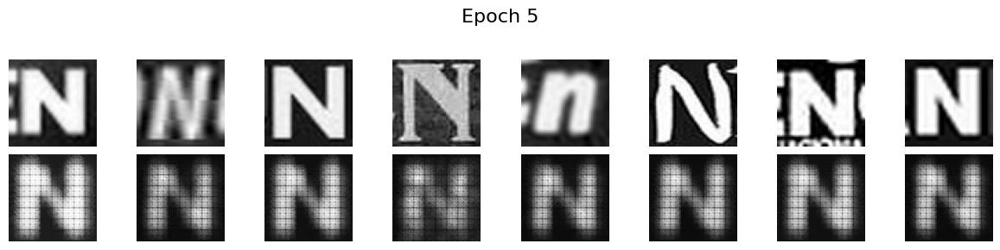

26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - kl_loss: 33.4852 - reconstruction_loss: 2612.9841 - total_loss: 2646.4695
Epoch 6/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - kl_loss: 32.7573 - reconstruction_loss: 2544.4993 - total_loss: 2577.2566
Epoch 7/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - kl_loss: 30.8972 - reconstruction_loss: 2475.8359 - total_loss: 2506.7332
Epoch 8/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - kl_loss: 31.0303 - reconstruction_loss: 2446.5405 - total_loss: 2477.5706
Epoch 9/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - kl_loss: 35.5149 - reconstruction_loss: 2373.5056 - total_loss: 2409.0205
Epoch 10/70
24/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 39.0042 - reconstruction_loss: 2331.1794 - total_loss: 2370.1836

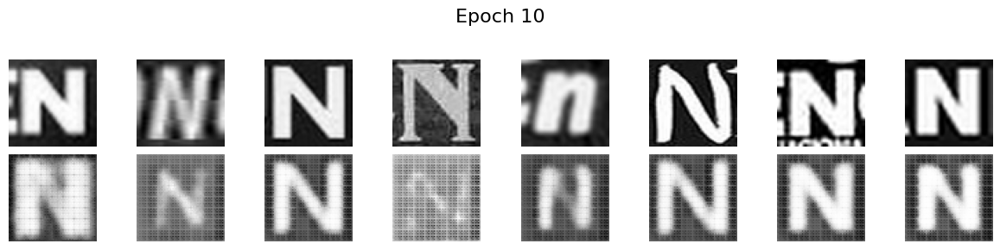

26/26 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - kl_loss: 39.4559 - reconstruction_loss: 2325.2178 - total_loss: 2364.6736
Epoch 11/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - kl_loss: 50.4925 - reconstruction_loss: 2210.8660 - total_loss: 2261.3586
Epoch 12/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 51.8173 - reconstruction_loss: 2117.2517 - total_loss: 2169.0691
Epoch 13/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - kl_loss: 48.6697 - reconstruction_loss: 2097.0769 - total_loss: 2145.7463
Epoch 14/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - kl_loss: 47.1474 - reconstruction_loss: 2100.6895 - total_loss: 2147.8369
Epoch 15/70
23/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - kl_loss: 44.6943 - reconstruction_loss: 2059.1548 - total_loss: 2103.8491

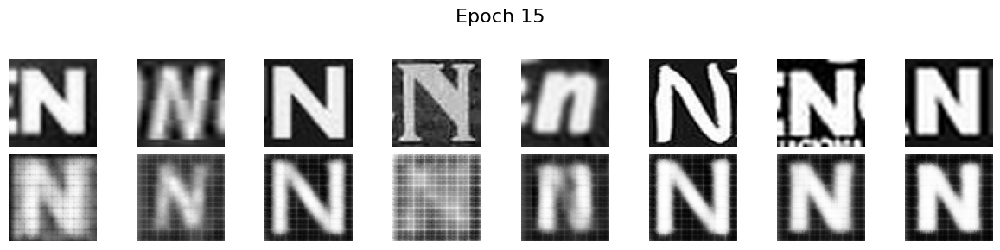

26/26 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - kl_loss: 44.6784 - reconstruction_loss: 2059.7844 - total_loss: 2104.4629
Epoch 16/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 42.5955 - reconstruction_loss: 2053.6648 - total_loss: 2096.2603
Epoch 17/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 42.6582 - reconstruction_loss: 2053.3381 - total_loss: 2095.9963
Epoch 18/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - kl_loss: 42.2997 - reconstruction_loss: 2035.3961 - total_loss: 2077.6958
Epoch 19/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - kl_loss: 40.3564 - reconstruction_loss: 2058.3206 - total_loss: 2098.6770
Epoch 20/70
25/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 39.5129 - reconstruction_loss: 2047.4988 - total_loss: 2087.0117

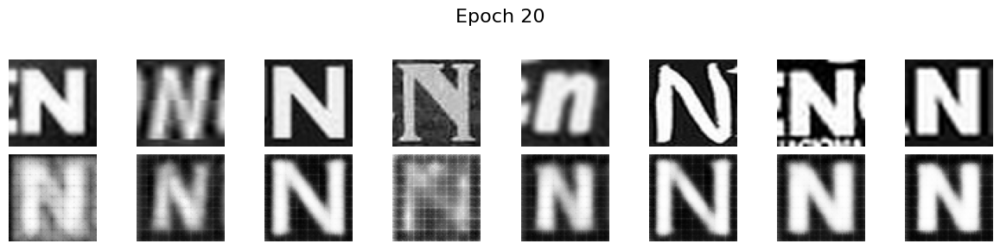

26/26 ━━━━━━━━━━━━━━━━━━━━ 6s 203ms/step - kl_loss: 39.5391 - reconstruction_loss: 2047.3491 - total_loss: 2086.8882
Epoch 21/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - kl_loss: 40.7519 - reconstruction_loss: 2022.5522 - total_loss: 2063.3040
Epoch 22/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - kl_loss: 40.0607 - reconstruction_loss: 2024.6930 - total_loss: 2064.7537
Epoch 23/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 39.5623 - reconstruction_loss: 2029.0576 - total_loss: 2068.6196
Epoch 24/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - kl_loss: 40.4014 - reconstruction_loss: 2026.2557 - total_loss: 2066.6572
Epoch 25/70
25/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 40.3493 - reconstruction_loss: 2005.8890 - total_loss: 2046.2385

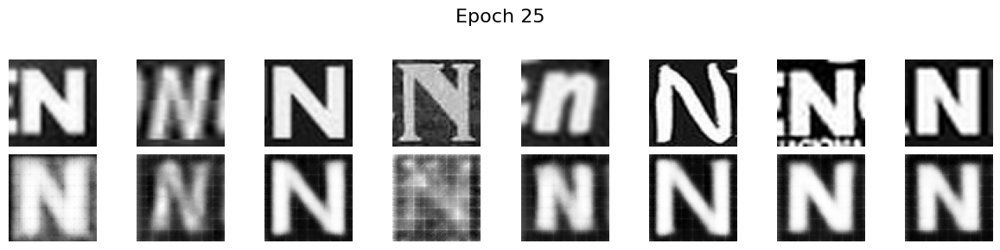

26/26 ━━━━━━━━━━━━━━━━━━━━ 4s 134ms/step - kl_loss: 40.3424 - reconstruction_loss: 2005.7909 - total_loss: 2046.1335
Epoch 26/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - kl_loss: 40.3707 - reconstruction_loss: 2026.9854 - total_loss: 2067.3562
Epoch 27/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - kl_loss: 41.3463 - reconstruction_loss: 1989.5817 - total_loss: 2030.9279
Epoch 28/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - kl_loss: 41.7899 - reconstruction_loss: 1995.7168 - total_loss: 2037.5067
Epoch 29/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - kl_loss: 41.8578 - reconstruction_loss: 1996.8496 - total_loss: 2038.7075
Epoch 30/70
25/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 41.4793 - reconstruction_loss: 2006.7759 - total_loss: 2048.2554

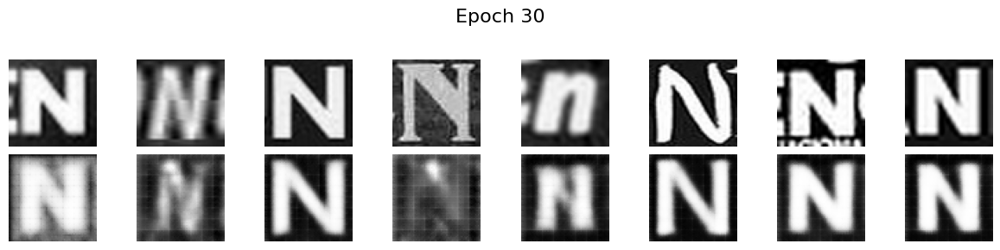

26/26 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - kl_loss: 41.4910 - reconstruction_loss: 2005.8619 - total_loss: 2047.3530
Epoch 31/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 42.5984 - reconstruction_loss: 2011.8331 - total_loss: 2054.4316
Epoch 32/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 41.2231 - reconstruction_loss: 1998.8346 - total_loss: 2040.0580
Epoch 33/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - kl_loss: 42.5953 - reconstruction_loss: 1986.5597 - total_loss: 2029.1549
Epoch 34/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - kl_loss: 42.8052 - reconstruction_loss: 1993.6899 - total_loss: 2036.4949
Epoch 35/70
23/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - kl_loss: 43.1703 - reconstruction_loss: 1973.6312 - total_loss: 2016.8015

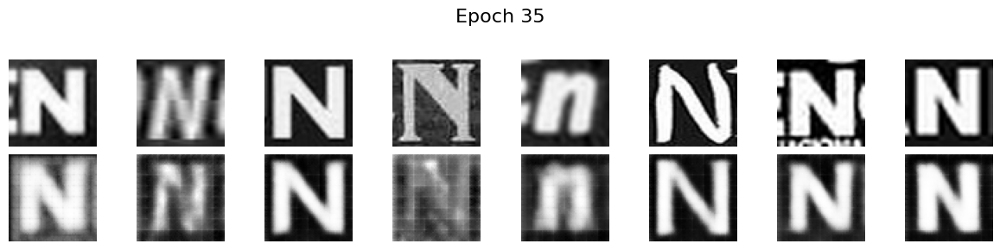

26/26 ━━━━━━━━━━━━━━━━━━━━ 4s 140ms/step - kl_loss: 43.1256 - reconstruction_loss: 1975.1497 - total_loss: 2018.2754
Epoch 36/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 43.0885 - reconstruction_loss: 1960.1387 - total_loss: 2003.2271
Epoch 37/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - kl_loss: 43.8565 - reconstruction_loss: 1960.7395 - total_loss: 2004.5959
Epoch 38/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 44.0214 - reconstruction_loss: 1994.0286 - total_loss: 2038.0499
Epoch 39/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - kl_loss: 43.4750 - reconstruction_loss: 1993.3325 - total_loss: 2036.8075
Epoch 40/70
23/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 43.9399 - reconstruction_loss: 1979.5746 - total_loss: 2023.5144

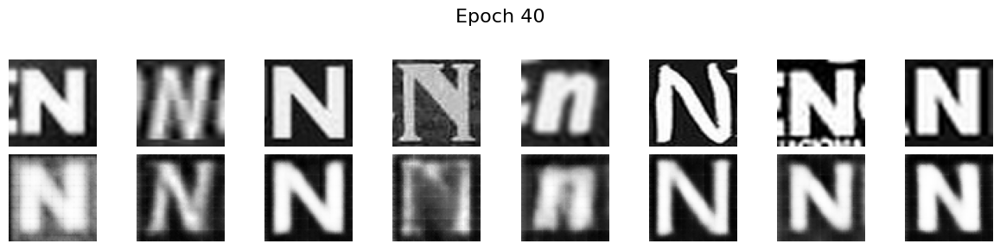

26/26 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - kl_loss: 43.9834 - reconstruction_loss: 1978.3508 - total_loss: 2022.3342
Epoch 41/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 45.2437 - reconstruction_loss: 1966.9197 - total_loss: 2012.1632
Epoch 42/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 44.8013 - reconstruction_loss: 1972.0624 - total_loss: 2016.8635
Epoch 43/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 45.1014 - reconstruction_loss: 1929.3986 - total_loss: 1974.4998
Epoch 44/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - kl_loss: 44.9765 - reconstruction_loss: 1950.7963 - total_loss: 1995.7726
Epoch 45/70
25/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 45.1248 - reconstruction_loss: 1964.0084 - total_loss: 2009.1333

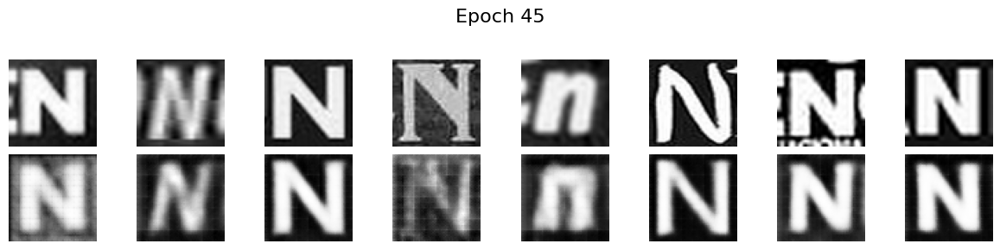

26/26 ━━━━━━━━━━━━━━━━━━━━ 7s 248ms/step - kl_loss: 45.1627 - reconstruction_loss: 1963.5399 - total_loss: 2008.7028
Epoch 46/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 45.2196 - reconstruction_loss: 1953.5297 - total_loss: 1998.7491
Epoch 47/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 45.7313 - reconstruction_loss: 1950.4962 - total_loss: 1996.2274
Epoch 48/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - kl_loss: 45.1212 - reconstruction_loss: 1957.9966 - total_loss: 2003.1178
Epoch 49/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 45.1973 - reconstruction_loss: 1976.8817 - total_loss: 2022.0790
Epoch 50/70
22/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 45.0052 - reconstruction_loss: 1962.0614 - total_loss: 2007.0667

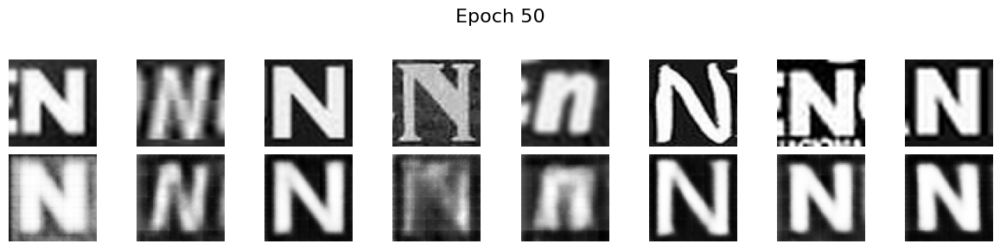

26/26 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - kl_loss: 44.9987 - reconstruction_loss: 1959.8363 - total_loss: 2004.8352
Epoch 51/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 45.6752 - reconstruction_loss: 1948.6598 - total_loss: 1994.3348
Epoch 52/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 45.7224 - reconstruction_loss: 1961.0668 - total_loss: 2006.7892
Epoch 53/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 46.8975 - reconstruction_loss: 1944.7828 - total_loss: 1991.6803
Epoch 54/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - kl_loss: 47.0608 - reconstruction_loss: 1922.2361 - total_loss: 1969.2971
Epoch 55/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 44.9178 - reconstruction_loss: 1957.8529 - total_loss: 2002.7706

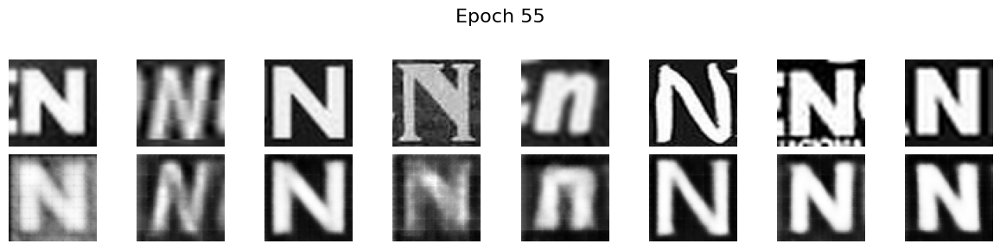

26/26 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - kl_loss: 44.9661 - reconstruction_loss: 1957.0372 - total_loss: 2002.0033
Epoch 56/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 46.3191 - reconstruction_loss: 1934.5775 - total_loss: 1980.8969
Epoch 57/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 45.6765 - reconstruction_loss: 1952.1367 - total_loss: 1997.8131
Epoch 58/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - kl_loss: 46.3459 - reconstruction_loss: 1939.2615 - total_loss: 1985.6073
Epoch 59/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - kl_loss: 46.3162 - reconstruction_loss: 1935.2987 - total_loss: 1981.6150
Epoch 60/70
23/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 46.1436 - reconstruction_loss: 1925.3656 - total_loss: 1971.5093

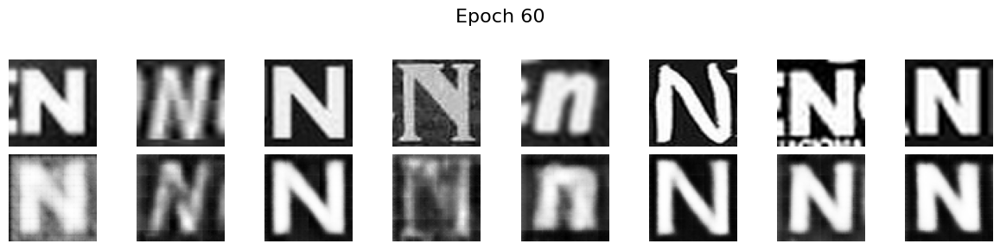

26/26 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - kl_loss: 46.1395 - reconstruction_loss: 1926.1270 - total_loss: 1972.2666
Epoch 61/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - kl_loss: 45.2561 - reconstruction_loss: 1956.0422 - total_loss: 2001.2982
Epoch 62/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 46.6186 - reconstruction_loss: 1910.5309 - total_loss: 1957.1493
Epoch 63/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 46.5454 - reconstruction_loss: 1940.4355 - total_loss: 1986.9807
Epoch 64/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - kl_loss: 46.7467 - reconstruction_loss: 1922.0386 - total_loss: 1968.7852
Epoch 65/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 46.6451 - reconstruction_loss: 1922.6238 - total_loss: 1969.2688

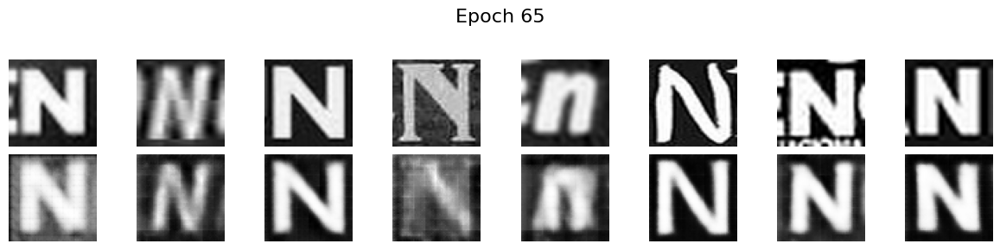

26/26 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - kl_loss: 46.6607 - reconstruction_loss: 1922.8019 - total_loss: 1969.4625
Epoch 66/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 48.1066 - reconstruction_loss: 1939.7794 - total_loss: 1987.8860
Epoch 67/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 47.0450 - reconstruction_loss: 1919.6663 - total_loss: 1966.7113
Epoch 68/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - kl_loss: 47.9403 - reconstruction_loss: 1910.3610 - total_loss: 1958.3014
Epoch 69/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - kl_loss: 46.4059 - reconstruction_loss: 1932.3751 - total_loss: 1978.7810
Epoch 70/70
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 47.1621 - reconstruction_loss: 1920.9791 - total_loss: 1968.1414

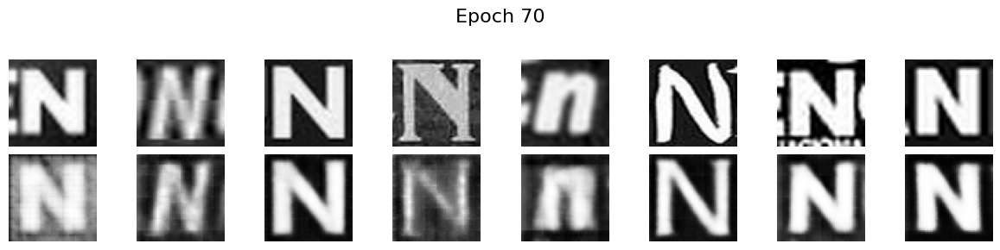

26/26 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - kl_loss: 47.1595 - reconstruction_loss: 1921.3711 - total_loss: 1968.5308
✅ Letra 'N' completada en 1.69 minutos.

====================== INICIANDO ENTRENAMIENTO: O ======================
   (Total: 328 imágenes | Steps/Epoch: 11 | Epochs: 70)
🔹 Entrenando VAE para la letra 'O'...
Epoch 1/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 13s 496ms/step - kl_loss: 0.0276 - reconstruction_loss: 2839.7161 - total_loss: 2839.7437
Epoch 2/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - kl_loss: 0.0046 - reconstruction_loss: 2838.3923 - total_loss: 2838.3970
Epoch 3/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - kl_loss: 0.0033 - reconstruction_loss: 2837.0198 - total_loss: 2837.0229
Epoch 4/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - kl_loss: 0.0053 - reconstruction_loss: 2836.1411 - total_loss: 2836.1465
Epoch 5/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - kl_loss: 0.0112 - reconstruction_loss: 2834.1018 - total_loss: 2834.1130

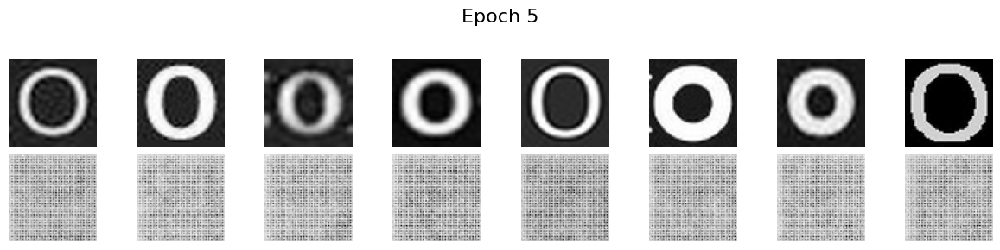

11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 218ms/step - kl_loss: 0.0115 - reconstruction_loss: 2834.0198 - total_loss: 2834.0312
Epoch 6/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 0.0345 - reconstruction_loss: 2832.3384 - total_loss: 2832.3730
Epoch 7/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - kl_loss: 0.1400 - reconstruction_loss: 2828.9219 - total_loss: 2829.0618
Epoch 8/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - kl_loss: 0.5641 - reconstruction_loss: 2823.7888 - total_loss: 2824.3533
Epoch 9/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - kl_loss: 2.3843 - reconstruction_loss: 2811.2263 - total_loss: 2813.6104
Epoch 10/70
 9/11 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 9.7783 - reconstruction_loss: 2790.7383 - total_loss: 2800.5166

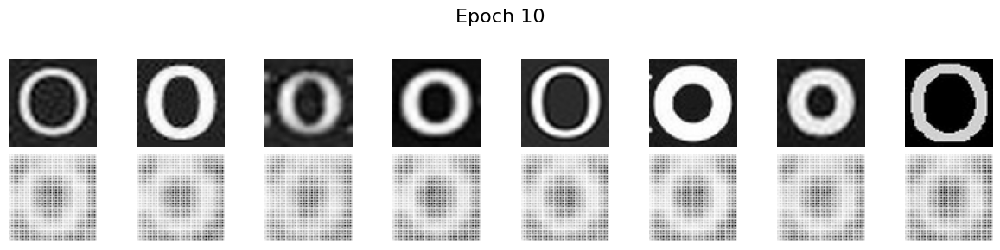

11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 276ms/step - kl_loss: 10.6923 - reconstruction_loss: 2787.3870 - total_loss: 2798.0791
Epoch 11/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - kl_loss: 30.5398 - reconstruction_loss: 2709.0322 - total_loss: 2739.5718
Epoch 12/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 53.4910 - reconstruction_loss: 2594.8752 - total_loss: 2648.3662
Epoch 13/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - kl_loss: 45.2142 - reconstruction_loss: 2532.8281 - total_loss: 2578.0422
Epoch 14/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - kl_loss: 40.5319 - reconstruction_loss: 2494.6846 - total_loss: 2535.2163
Epoch 15/70
 9/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 40.2602 - reconstruction_loss: 2460.8774 - total_loss: 2501.1377

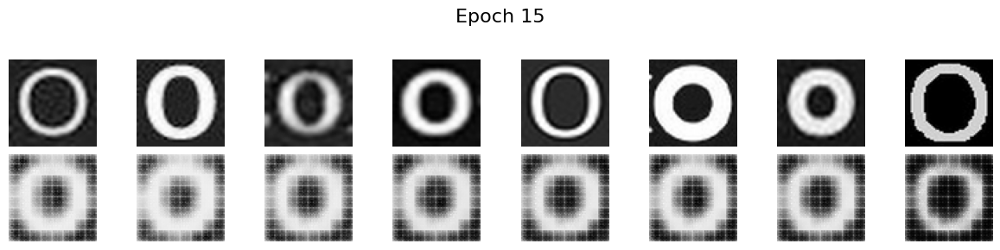

11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 292ms/step - kl_loss: 39.5876 - reconstruction_loss: 2464.3279 - total_loss: 2503.9158
Epoch 16/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 33.1206 - reconstruction_loss: 2488.8616 - total_loss: 2521.9819
Epoch 17/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - kl_loss: 30.4346 - reconstruction_loss: 2463.7410 - total_loss: 2494.1755
Epoch 18/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - kl_loss: 29.8791 - reconstruction_loss: 2443.2957 - total_loss: 2473.1746
Epoch 19/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - kl_loss: 31.2190 - reconstruction_loss: 2402.5234 - total_loss: 2433.7424
Epoch 20/70
 9/11 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 30.5722 - reconstruction_loss: 2352.4314 - total_loss: 2383.0037

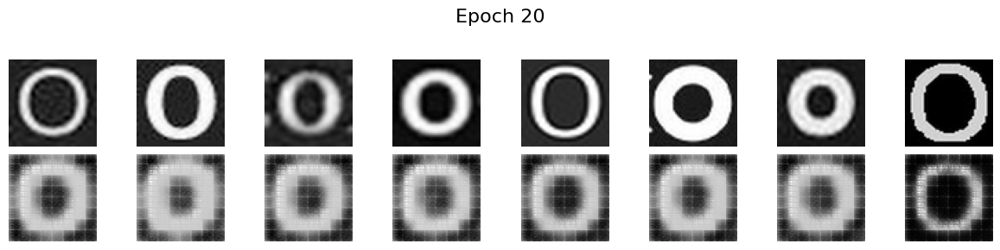

11/11 ━━━━━━━━━━━━━━━━━━━━ 4s 318ms/step - kl_loss: 30.0295 - reconstruction_loss: 2366.4458 - total_loss: 2396.4756
Epoch 21/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 28.9085 - reconstruction_loss: 2359.9473 - total_loss: 2388.8557
Epoch 22/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - kl_loss: 29.1385 - reconstruction_loss: 2352.8127 - total_loss: 2381.9514
Epoch 23/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - kl_loss: 28.3896 - reconstruction_loss: 2379.9771 - total_loss: 2408.3667
Epoch 24/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - kl_loss: 28.9306 - reconstruction_loss: 2330.6025 - total_loss: 2359.5332
Epoch 25/70
10/11 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - kl_loss: 32.4598 - reconstruction_loss: 2328.6270 - total_loss: 2361.0869

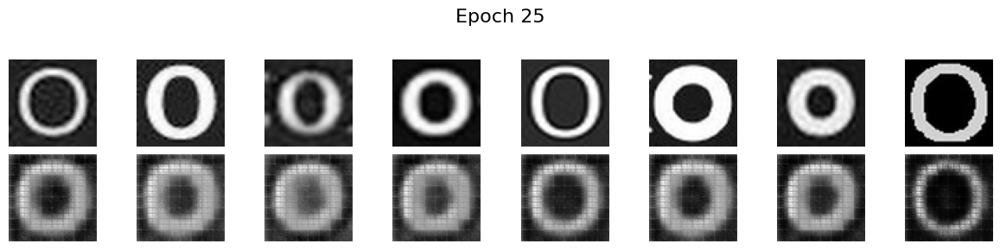

11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 573ms/step - kl_loss: 32.4286 - reconstruction_loss: 2325.9297 - total_loss: 2358.3584
Epoch 26/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 34.6545 - reconstruction_loss: 2292.3291 - total_loss: 2326.9834
Epoch 27/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 38.6410 - reconstruction_loss: 2260.4827 - total_loss: 2299.1238
Epoch 28/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - kl_loss: 41.9286 - reconstruction_loss: 2226.2983 - total_loss: 2268.2271
Epoch 29/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - kl_loss: 45.1389 - reconstruction_loss: 2178.2229 - total_loss: 2223.3618
Epoch 30/70
 9/11 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 48.1038 - reconstruction_loss: 2154.5505 - total_loss: 2202.6543

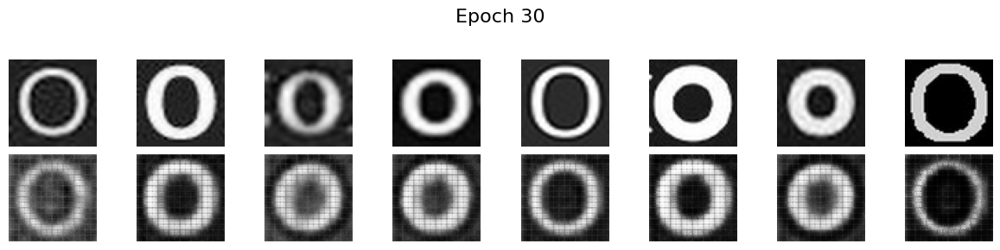

11/11 ━━━━━━━━━━━━━━━━━━━━ 4s 331ms/step - kl_loss: 48.5182 - reconstruction_loss: 2152.6858 - total_loss: 2201.2041
Epoch 31/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 52.1107 - reconstruction_loss: 2145.8704 - total_loss: 2197.9812
Epoch 32/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 53.5483 - reconstruction_loss: 2061.0195 - total_loss: 2114.5679
Epoch 33/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 50.4775 - reconstruction_loss: 2082.8716 - total_loss: 2133.3491
Epoch 34/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - kl_loss: 48.6706 - reconstruction_loss: 2064.2097 - total_loss: 2112.8804
Epoch 35/70
 9/11 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 48.5478 - reconstruction_loss: 2053.4119 - total_loss: 2101.9597

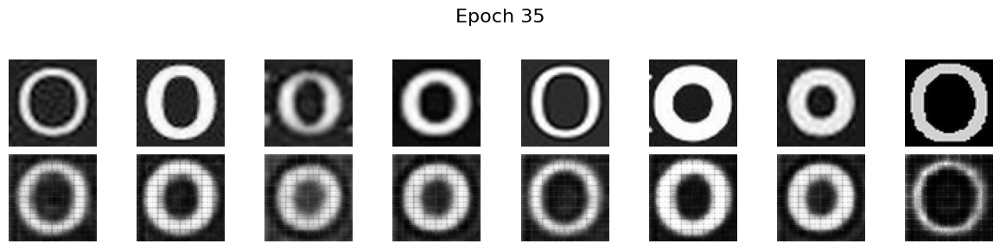

11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 268ms/step - kl_loss: 48.5177 - reconstruction_loss: 2051.9685 - total_loss: 2100.4861
Epoch 36/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - kl_loss: 49.6962 - reconstruction_loss: 2024.8945 - total_loss: 2074.5908
Epoch 37/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 44.4700 - reconstruction_loss: 2083.2522 - total_loss: 2127.7224
Epoch 38/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 46.9820 - reconstruction_loss: 1993.1172 - total_loss: 2040.0992
Epoch 39/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - kl_loss: 43.2526 - reconstruction_loss: 2040.0269 - total_loss: 2083.2795
Epoch 40/70
 9/11 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 43.4146 - reconstruction_loss: 2058.9399 - total_loss: 2102.3547

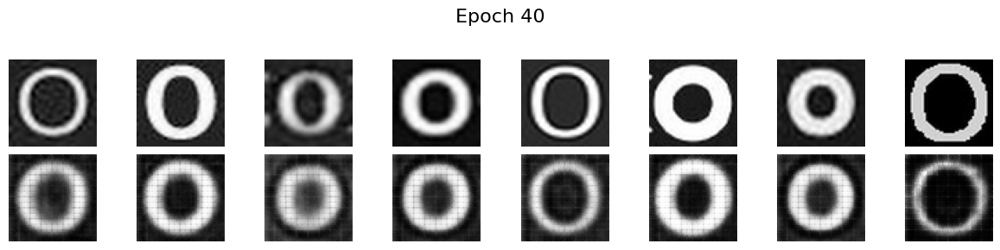

11/11 ━━━━━━━━━━━━━━━━━━━━ 4s 305ms/step - kl_loss: 43.5726 - reconstruction_loss: 2050.4160 - total_loss: 2093.9885
Epoch 41/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 43.5221 - reconstruction_loss: 2032.1648 - total_loss: 2075.6870
Epoch 42/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 42.7504 - reconstruction_loss: 2029.0547 - total_loss: 2071.8052
Epoch 43/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 42.7228 - reconstruction_loss: 2013.3044 - total_loss: 2056.0273
Epoch 44/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - kl_loss: 42.1761 - reconstruction_loss: 2033.2095 - total_loss: 2075.3855
Epoch 45/70
 9/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 41.9548 - reconstruction_loss: 2019.6246 - total_loss: 2061.5796

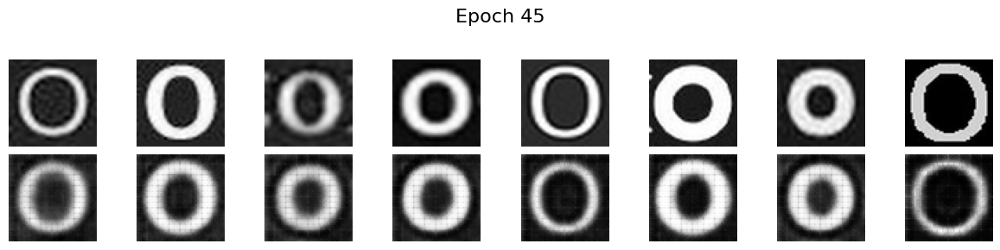

11/11 ━━━━━━━━━━━━━━━━━━━━ 4s 330ms/step - kl_loss: 42.1527 - reconstruction_loss: 2017.5974 - total_loss: 2059.7500
Epoch 46/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 42.7247 - reconstruction_loss: 1990.7545 - total_loss: 2033.4792
Epoch 47/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 42.5450 - reconstruction_loss: 2003.8115 - total_loss: 2046.3564
Epoch 48/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 41.7456 - reconstruction_loss: 2012.4786 - total_loss: 2054.2241
Epoch 49/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - kl_loss: 42.2506 - reconstruction_loss: 2004.9130 - total_loss: 2047.1637
Epoch 50/70
 8/11 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - kl_loss: 42.4570 - reconstruction_loss: 1983.9980 - total_loss: 2026.4552

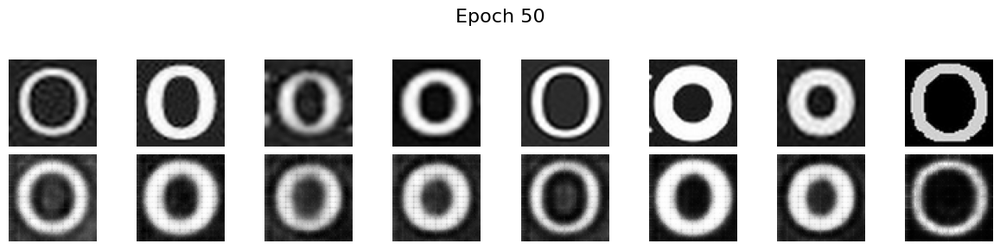

11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 599ms/step - kl_loss: 42.5992 - reconstruction_loss: 1986.6851 - total_loss: 2029.2842
Epoch 51/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 42.5714 - reconstruction_loss: 1967.2407 - total_loss: 2009.8121
Epoch 52/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - kl_loss: 42.6729 - reconstruction_loss: 1982.7278 - total_loss: 2025.4006
Epoch 53/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - kl_loss: 41.3173 - reconstruction_loss: 2013.8367 - total_loss: 2055.1541
Epoch 54/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 41.6805 - reconstruction_loss: 1995.2405 - total_loss: 2036.9210
Epoch 55/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - kl_loss: 40.5466 - reconstruction_loss: 2012.5089 - total_loss: 2053.0557

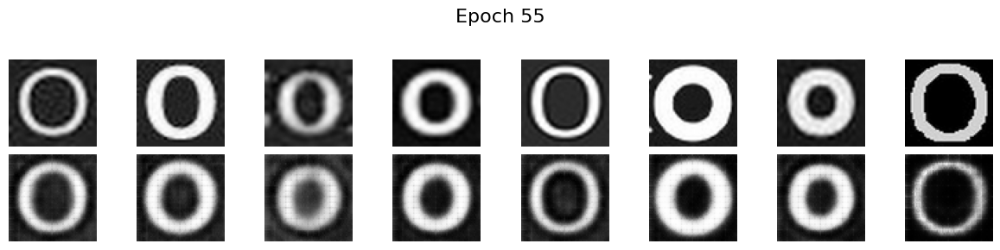

11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 300ms/step - kl_loss: 40.6624 - reconstruction_loss: 2010.2791 - total_loss: 2050.9414
Epoch 56/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 43.4893 - reconstruction_loss: 1939.5010 - total_loss: 1982.9904
Epoch 57/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 42.1341 - reconstruction_loss: 1995.2781 - total_loss: 2037.4124
Epoch 58/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 45.2462 - reconstruction_loss: 1931.5310 - total_loss: 1976.7771
Epoch 59/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 42.7633 - reconstruction_loss: 1978.5895 - total_loss: 2021.3528
Epoch 60/70
 9/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 40.7509 - reconstruction_loss: 2008.8093 - total_loss: 2049.5603

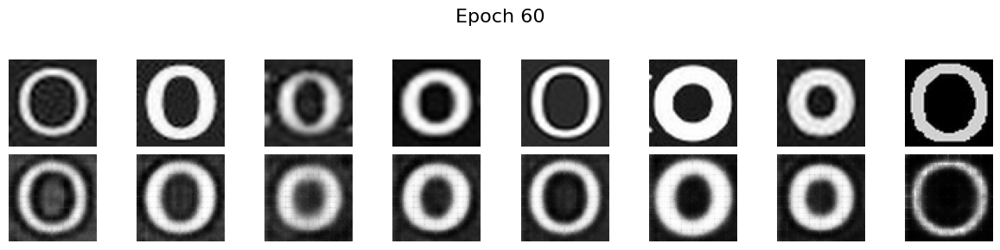

11/11 ━━━━━━━━━━━━━━━━━━━━ 4s 334ms/step - kl_loss: 41.0381 - reconstruction_loss: 1997.9369 - total_loss: 2038.9750
Epoch 61/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 40.2886 - reconstruction_loss: 2003.2509 - total_loss: 2043.5394
Epoch 62/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 42.0431 - reconstruction_loss: 1978.5521 - total_loss: 2020.5952
Epoch 63/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - kl_loss: 42.2063 - reconstruction_loss: 1975.1853 - total_loss: 2017.3914
Epoch 64/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - kl_loss: 43.3604 - reconstruction_loss: 1934.0133 - total_loss: 1977.3738
Epoch 65/70
 9/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 43.7380 - reconstruction_loss: 1928.1390 - total_loss: 1971.8770

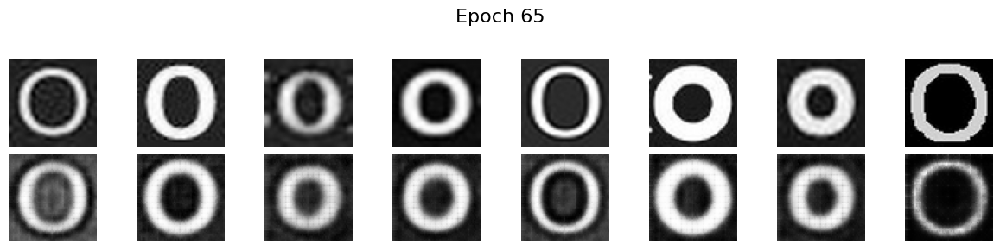

11/11 ━━━━━━━━━━━━━━━━━━━━ 4s 289ms/step - kl_loss: 43.4945 - reconstruction_loss: 1936.7808 - total_loss: 1980.2753
Epoch 66/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - kl_loss: 41.6945 - reconstruction_loss: 1973.2073 - total_loss: 2014.9019
Epoch 67/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - kl_loss: 41.6390 - reconstruction_loss: 1966.9982 - total_loss: 2008.6371
Epoch 68/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - kl_loss: 42.9292 - reconstruction_loss: 1924.7776 - total_loss: 1967.7068
Epoch 69/70
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - kl_loss: 45.4680 - reconstruction_loss: 1904.2999 - total_loss: 1949.7679
Epoch 70/70
 9/11 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - kl_loss: 45.2575 - reconstruction_loss: 1938.3643 - total_loss: 1983.6217

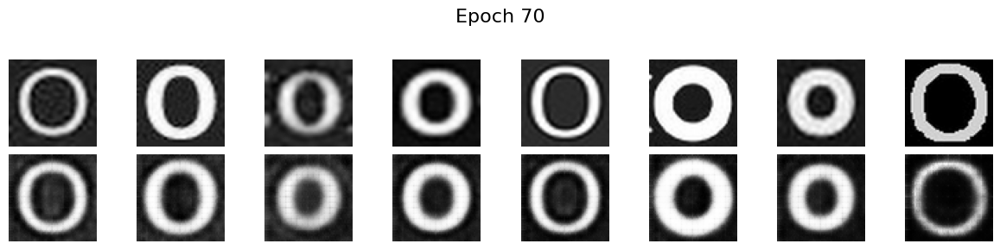

11/11 ━━━━━━━━━━━━━━━━━━━━ 4s 305ms/step - kl_loss: 44.7008 - reconstruction_loss: 1941.4133 - total_loss: 1986.1141
✅ Letra 'O' completada en 2.47 minutos.

====================== INICIANDO ENTRENAMIENTO: P ======================
   (Total: 378 imágenes | Steps/Epoch: 12 | Epochs: 70)
🔹 Entrenando VAE para la letra 'P'...
Epoch 1/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 13s 470ms/step - kl_loss: 0.0772 - reconstruction_loss: 2839.0017 - total_loss: 2839.0791
Epoch 2/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - kl_loss: 0.0058 - reconstruction_loss: 2838.5039 - total_loss: 2838.5095
Epoch 3/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - kl_loss: 0.0040 - reconstruction_loss: 2838.3240 - total_loss: 2838.3279
Epoch 4/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - kl_loss: 0.0062 - reconstruction_loss: 2837.8335 - total_loss: 2837.8396
Epoch 5/70
11/12 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - kl_loss: 0.0142 - reconstruction_loss: 2836.6758 - total_loss: 2836.6897

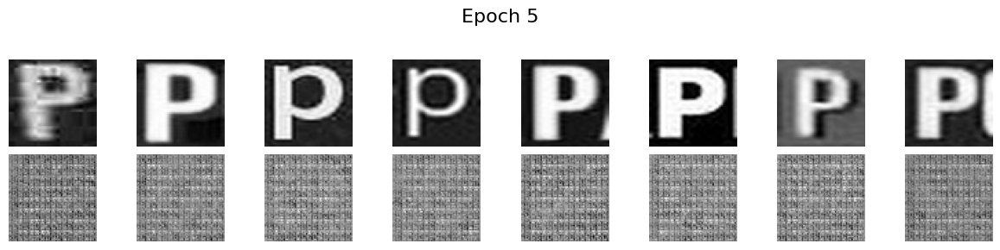

12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 251ms/step - kl_loss: 0.0147 - reconstruction_loss: 2836.7207 - total_loss: 2836.7354
Epoch 6/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 0.0382 - reconstruction_loss: 2835.8345 - total_loss: 2835.8726
Epoch 7/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - kl_loss: 0.1098 - reconstruction_loss: 2834.5408 - total_loss: 2834.6506
Epoch 8/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - kl_loss: 0.3761 - reconstruction_loss: 2830.8833 - total_loss: 2831.2593
Epoch 9/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - kl_loss: 1.8728 - reconstruction_loss: 2825.5181 - total_loss: 2827.3911
Epoch 10/70
 9/12 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 8.6893 - reconstruction_loss: 2802.8032 - total_loss: 2811.4924

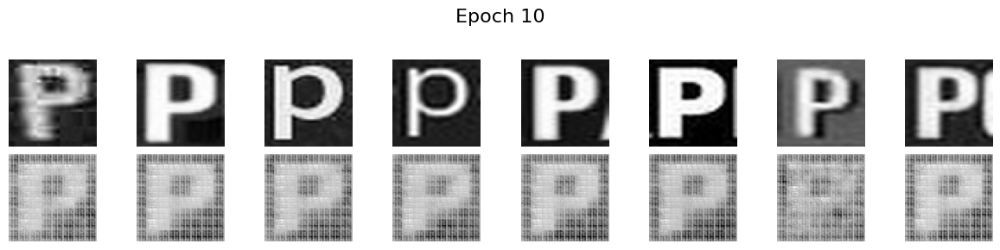

12/12 ━━━━━━━━━━━━━━━━━━━━ 4s 297ms/step - kl_loss: 10.2496 - reconstruction_loss: 2797.6040 - total_loss: 2807.8535
Epoch 11/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - kl_loss: 35.8600 - reconstruction_loss: 2696.0503 - total_loss: 2731.9102
Epoch 12/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 43.1458 - reconstruction_loss: 2611.5469 - total_loss: 2654.6929
Epoch 13/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - kl_loss: 33.6055 - reconstruction_loss: 2553.4980 - total_loss: 2587.1035
Epoch 14/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - kl_loss: 33.1202 - reconstruction_loss: 2536.7700 - total_loss: 2569.8899
Epoch 15/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 36.7178 - reconstruction_loss: 2482.7358 - total_loss: 2519.4534

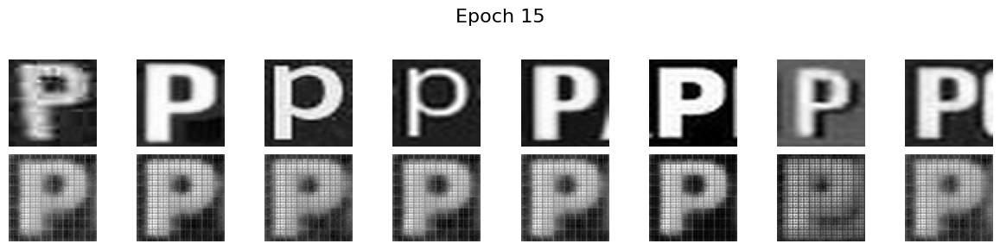

12/12 ━━━━━━━━━━━━━━━━━━━━ 4s 306ms/step - kl_loss: 36.8972 - reconstruction_loss: 2481.4189 - total_loss: 2518.3159
Epoch 16/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - kl_loss: 45.0353 - reconstruction_loss: 2395.8979 - total_loss: 2440.9331
Epoch 17/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 44.0232 - reconstruction_loss: 2362.2969 - total_loss: 2406.3201
Epoch 18/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 46.0396 - reconstruction_loss: 2286.5891 - total_loss: 2332.6287
Epoch 19/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - kl_loss: 45.8887 - reconstruction_loss: 2242.7451 - total_loss: 2288.6340
Epoch 20/70
 9/12 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 41.0840 - reconstruction_loss: 2259.8083 - total_loss: 2300.8926

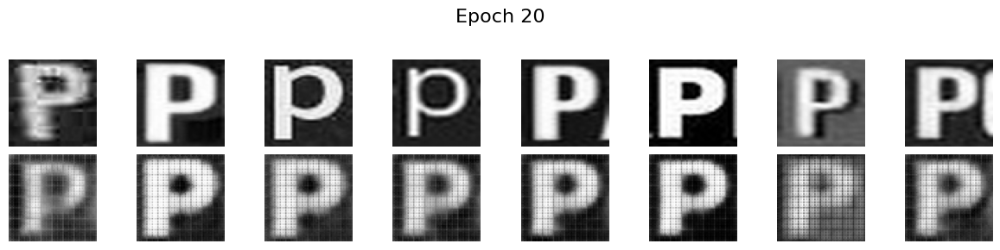

12/12 ━━━━━━━━━━━━━━━━━━━━ 4s 289ms/step - kl_loss: 41.6218 - reconstruction_loss: 2255.9585 - total_loss: 2297.5803
Epoch 21/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 42.9943 - reconstruction_loss: 2229.5503 - total_loss: 2272.5449
Epoch 22/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - kl_loss: 41.9994 - reconstruction_loss: 2179.7014 - total_loss: 2221.7012
Epoch 23/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - kl_loss: 43.4574 - reconstruction_loss: 2194.6560 - total_loss: 2238.1133
Epoch 24/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - kl_loss: 46.8730 - reconstruction_loss: 2145.3535 - total_loss: 2192.2263
Epoch 25/70
10/12 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 40.5900 - reconstruction_loss: 2202.6736 - total_loss: 2243.2634

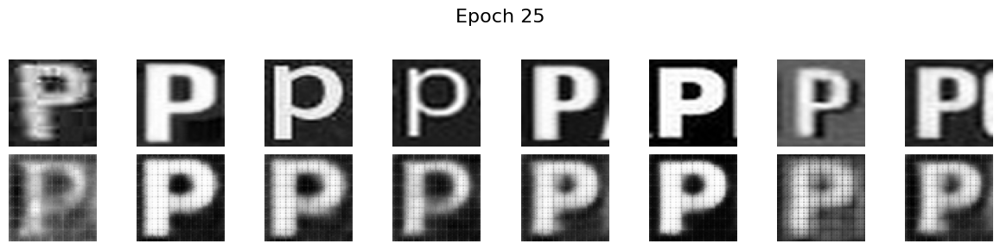

12/12 ━━━━━━━━━━━━━━━━━━━━ 4s 269ms/step - kl_loss: 41.1826 - reconstruction_loss: 2192.5588 - total_loss: 2233.7415
Epoch 26/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 44.2967 - reconstruction_loss: 2134.5039 - total_loss: 2178.8005
Epoch 27/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 43.0041 - reconstruction_loss: 2154.1492 - total_loss: 2197.1531
Epoch 28/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - kl_loss: 43.4714 - reconstruction_loss: 2124.6311 - total_loss: 2168.1025
Epoch 29/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - kl_loss: 44.6047 - reconstruction_loss: 2107.7034 - total_loss: 2152.3081
Epoch 30/70
 9/12 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 41.8776 - reconstruction_loss: 2138.0017 - total_loss: 2179.8794

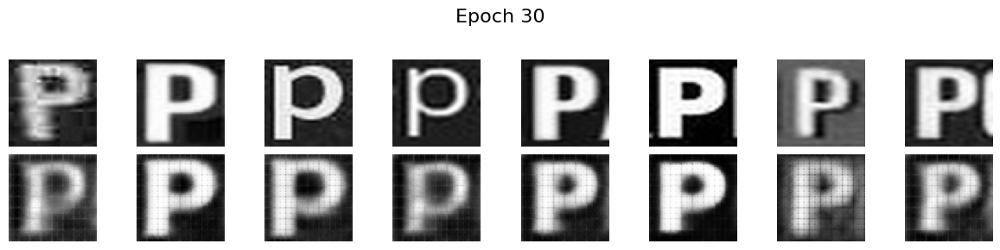

12/12 ━━━━━━━━━━━━━━━━━━━━ 4s 284ms/step - kl_loss: 42.1324 - reconstruction_loss: 2131.0930 - total_loss: 2173.2253
Epoch 31/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 42.7606 - reconstruction_loss: 2119.9871 - total_loss: 2162.7478
Epoch 32/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - kl_loss: 43.0870 - reconstruction_loss: 2101.8367 - total_loss: 2144.9236
Epoch 33/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - kl_loss: 45.1961 - reconstruction_loss: 2066.3828 - total_loss: 2111.5786
Epoch 34/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - kl_loss: 43.1621 - reconstruction_loss: 2098.4739 - total_loss: 2141.6360
Epoch 35/70
11/12 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - kl_loss: 44.2173 - reconstruction_loss: 2080.5955 - total_loss: 2124.8127

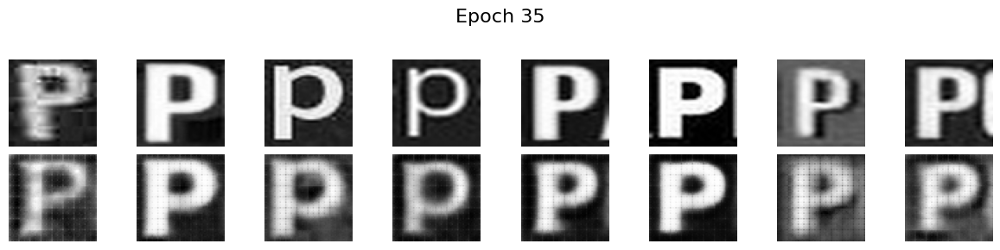

12/12 ━━━━━━━━━━━━━━━━━━━━ 4s 348ms/step - kl_loss: 44.0864 - reconstruction_loss: 2081.6775 - total_loss: 2125.7639
Epoch 36/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 42.3075 - reconstruction_loss: 2087.8147 - total_loss: 2130.1221
Epoch 37/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 44.0238 - reconstruction_loss: 2075.4133 - total_loss: 2119.4375
Epoch 38/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 43.1046 - reconstruction_loss: 2084.1353 - total_loss: 2127.2400
Epoch 39/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - kl_loss: 43.6665 - reconstruction_loss: 2072.1392 - total_loss: 2115.8054
Epoch 40/70
 9/12 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 42.5096 - reconstruction_loss: 2117.1599 - total_loss: 2159.6694

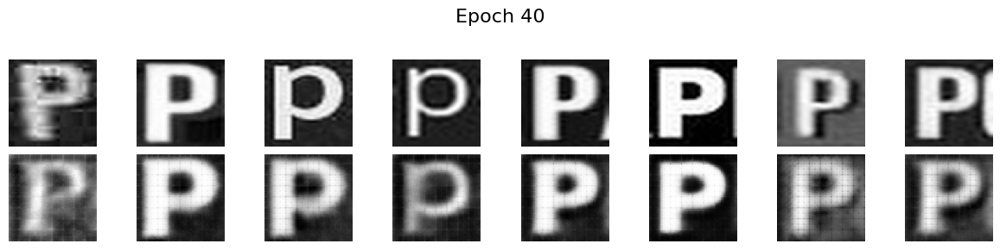

12/12 ━━━━━━━━━━━━━━━━━━━━ 4s 294ms/step - kl_loss: 43.0156 - reconstruction_loss: 2103.3242 - total_loss: 2146.3398
Epoch 41/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - kl_loss: 43.0591 - reconstruction_loss: 2073.5903 - total_loss: 2116.6494
Epoch 42/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - kl_loss: 45.2599 - reconstruction_loss: 2023.1395 - total_loss: 2068.3994
Epoch 43/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - kl_loss: 43.2545 - reconstruction_loss: 2049.2468 - total_loss: 2092.5010
Epoch 44/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - kl_loss: 44.2580 - reconstruction_loss: 2032.2343 - total_loss: 2076.4924
Epoch 45/70
10/12 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - kl_loss: 42.6764 - reconstruction_loss: 2076.4426 - total_loss: 2119.1191

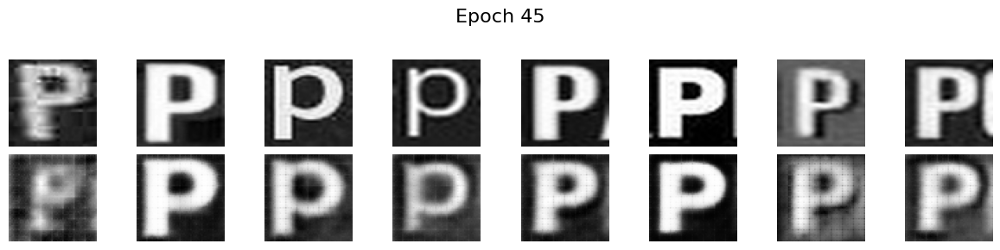

12/12 ━━━━━━━━━━━━━━━━━━━━ 4s 304ms/step - kl_loss: 42.8800 - reconstruction_loss: 2071.0867 - total_loss: 2113.9668
Epoch 46/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 44.6914 - reconstruction_loss: 2022.4386 - total_loss: 2067.1304
Epoch 47/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 44.0333 - reconstruction_loss: 2046.3011 - total_loss: 2090.3342
Epoch 48/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 44.4156 - reconstruction_loss: 2028.4675 - total_loss: 2072.8831
Epoch 49/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - kl_loss: 43.8274 - reconstruction_loss: 2038.4250 - total_loss: 2082.2524
Epoch 50/70
 9/12 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 41.2019 - reconstruction_loss: 2098.0188 - total_loss: 2139.2207

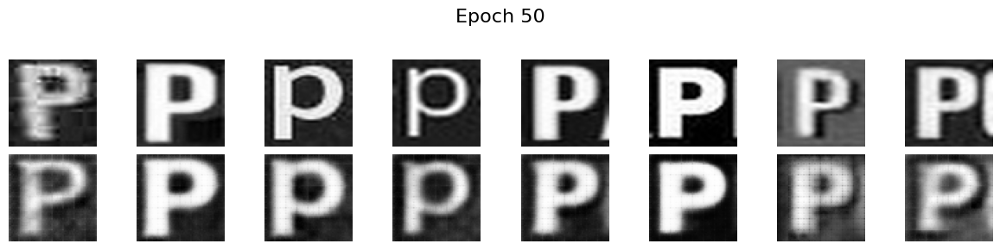

12/12 ━━━━━━━━━━━━━━━━━━━━ 4s 303ms/step - kl_loss: 41.9690 - reconstruction_loss: 2081.2512 - total_loss: 2123.2205
Epoch 51/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - kl_loss: 44.1393 - reconstruction_loss: 2049.2979 - total_loss: 2093.4373
Epoch 52/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 44.5429 - reconstruction_loss: 2027.1326 - total_loss: 2071.6755
Epoch 53/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 42.3632 - reconstruction_loss: 2067.2893 - total_loss: 2109.6523
Epoch 54/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - kl_loss: 44.7952 - reconstruction_loss: 2031.6453 - total_loss: 2076.4404
Epoch 55/70
10/12 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - kl_loss: 42.4840 - reconstruction_loss: 2065.5356 - total_loss: 2108.0198

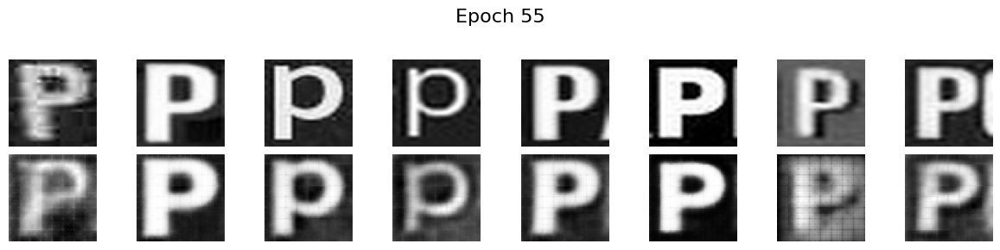

12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 252ms/step - kl_loss: 42.7151 - reconstruction_loss: 2058.2075 - total_loss: 2100.9226
Epoch 56/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 44.1818 - reconstruction_loss: 2020.1359 - total_loss: 2064.3179
Epoch 57/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 43.9626 - reconstruction_loss: 2020.6541 - total_loss: 2064.6169
Epoch 58/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - kl_loss: 41.4105 - reconstruction_loss: 2072.9670 - total_loss: 2114.3772
Epoch 59/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - kl_loss: 45.4846 - reconstruction_loss: 2005.4374 - total_loss: 2050.9221
Epoch 60/70
10/12 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - kl_loss: 43.4054 - reconstruction_loss: 2036.9255 - total_loss: 2080.3311

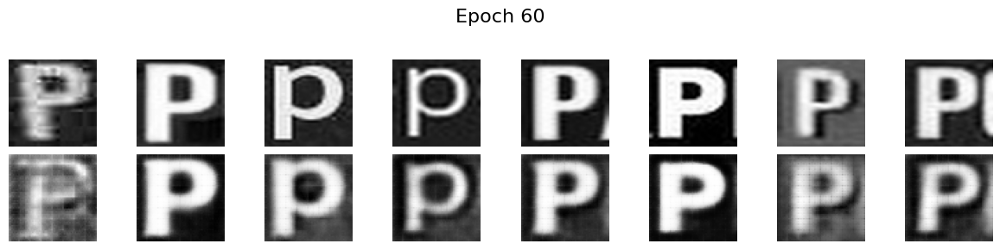

12/12 ━━━━━━━━━━━━━━━━━━━━ 6s 498ms/step - kl_loss: 43.5989 - reconstruction_loss: 2033.1012 - total_loss: 2076.7000
Epoch 61/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 43.3394 - reconstruction_loss: 2037.1051 - total_loss: 2080.4446
Epoch 62/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 42.9844 - reconstruction_loss: 2066.1455 - total_loss: 2109.1296
Epoch 63/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - kl_loss: 44.4112 - reconstruction_loss: 2015.3745 - total_loss: 2059.7859
Epoch 64/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 45.3750 - reconstruction_loss: 2005.6667 - total_loss: 2051.0417
Epoch 65/70
 9/12 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 44.6074 - reconstruction_loss: 2021.7261 - total_loss: 2066.3335

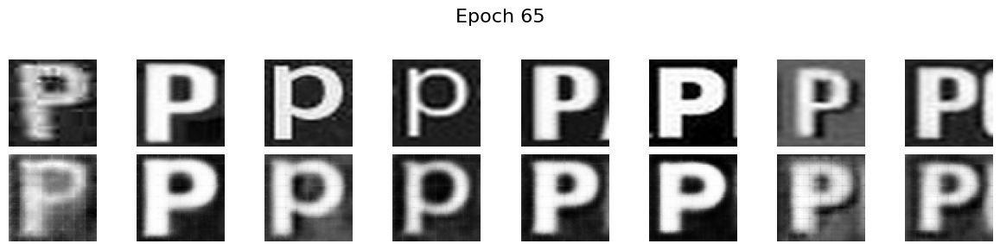

12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 306ms/step - kl_loss: 44.6575 - reconstruction_loss: 2020.4410 - total_loss: 2065.0984
Epoch 66/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 44.6264 - reconstruction_loss: 2044.6823 - total_loss: 2089.3086
Epoch 67/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 46.3058 - reconstruction_loss: 1986.8314 - total_loss: 2033.1373
Epoch 68/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - kl_loss: 45.1948 - reconstruction_loss: 2010.3364 - total_loss: 2055.5312
Epoch 69/70
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - kl_loss: 44.6053 - reconstruction_loss: 2034.6542 - total_loss: 2079.2595
Epoch 70/70
 9/12 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - kl_loss: 43.3565 - reconstruction_loss: 2040.6555 - total_loss: 2084.0120

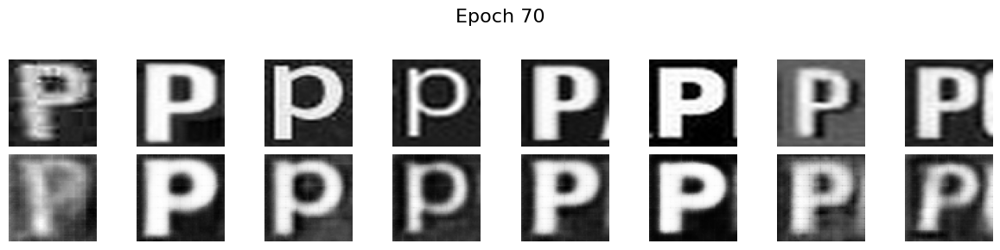

12/12 ━━━━━━━━━━━━━━━━━━━━ 4s 295ms/step - kl_loss: 43.7303 - reconstruction_loss: 2031.6323 - total_loss: 2075.3625
✅ Letra 'P' completada en 1.55 minutos.

====================== INICIANDO ENTRENAMIENTO: Q ======================
   (Total: 48 imágenes | Steps/Epoch: 2 | Epochs: 70)
🔹 Entrenando VAE para la letra 'Q'...
Epoch 1/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 13s 5s/step - kl_loss: 0.0269 - reconstruction_loss: 2840.0991 - total_loss: 2840.1260
Epoch 2/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - kl_loss: 0.0105 - reconstruction_loss: 2839.8555 - total_loss: 2839.8660
Epoch 3/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - kl_loss: 0.0067 - reconstruction_loss: 2839.4495 - total_loss: 2839.4561 
Epoch 4/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - kl_loss: 0.0059 - reconstruction_loss: 2839.1272 - total_loss: 2839.1333 
Epoch 5/70
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 714ms/step - kl_loss: 0.0057 - reconstruction_loss: 2838.9819 - total_loss: 2838.9878

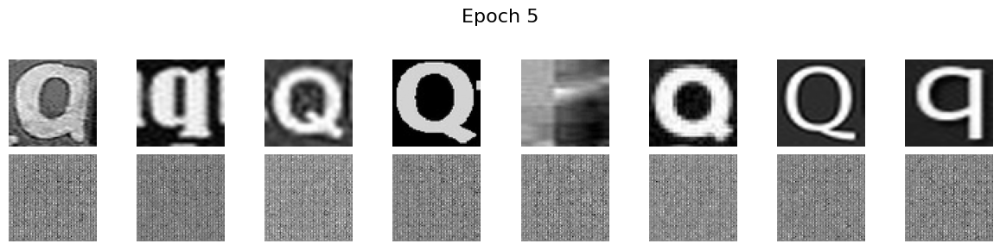

2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 2s/step - kl_loss: 0.0055 - reconstruction_loss: 2838.8333 - total_loss: 2838.8389   
Epoch 6/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - kl_loss: 0.0050 - reconstruction_loss: 2838.5129 - total_loss: 2838.5181
Epoch 7/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - kl_loss: 0.0044 - reconstruction_loss: 2838.2490 - total_loss: 2838.2534 
Epoch 8/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - kl_loss: 0.0040 - reconstruction_loss: 2837.9016 - total_loss: 2837.9058 
Epoch 9/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - kl_loss: 0.0037 - reconstruction_loss: 2837.5896 - total_loss: 2837.5935 
Epoch 10/70
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 572ms/step - kl_loss: 0.0037 - reconstruction_loss: 2837.5312 - total_loss: 2837.5349

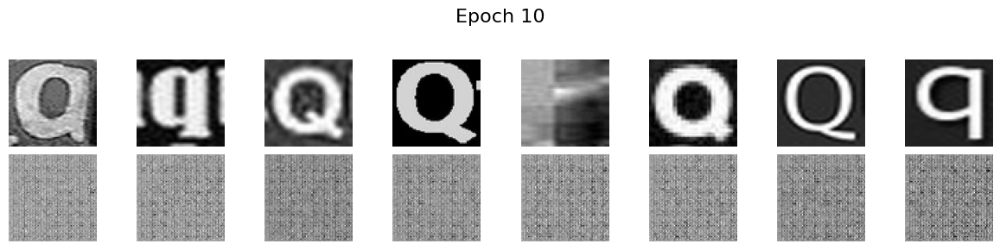

2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - kl_loss: 0.0035 - reconstruction_loss: 2837.3254 - total_loss: 2837.3286   
Epoch 11/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - kl_loss: 0.0034 - reconstruction_loss: 2836.9976 - total_loss: 2837.0007
Epoch 12/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - kl_loss: 0.0034 - reconstruction_loss: 2836.6980 - total_loss: 2836.7014
Epoch 13/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - kl_loss: 0.0035 - reconstruction_loss: 2836.4546 - total_loss: 2836.4580 
Epoch 14/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - kl_loss: 0.0037 - reconstruction_loss: 2836.0305 - total_loss: 2836.0339 
Epoch 15/70
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step - kl_loss: 0.0037 - reconstruction_loss: 2835.1731 - total_loss: 2835.1768

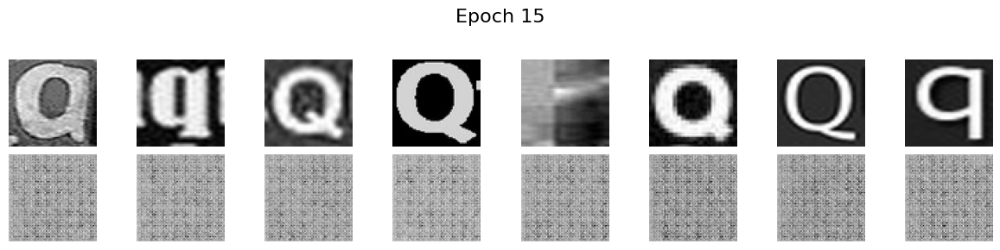

2/2 ━━━━━━━━━━━━━━━━━━━━ 7s 6s/step - kl_loss: 0.0038 - reconstruction_loss: 2835.7817 - total_loss: 2835.7854   
Epoch 16/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - kl_loss: 0.0041 - reconstruction_loss: 2835.3738 - total_loss: 2835.3779
Epoch 17/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - kl_loss: 0.0047 - reconstruction_loss: 2835.0813 - total_loss: 2835.0859
Epoch 18/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - kl_loss: 0.0054 - reconstruction_loss: 2834.7551 - total_loss: 2834.7607
Epoch 19/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - kl_loss: 0.0063 - reconstruction_loss: 2834.1929 - total_loss: 2834.1992
Epoch 20/70
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 600ms/step - kl_loss: 0.0074 - reconstruction_loss: 2833.5220 - total_loss: 2833.5293

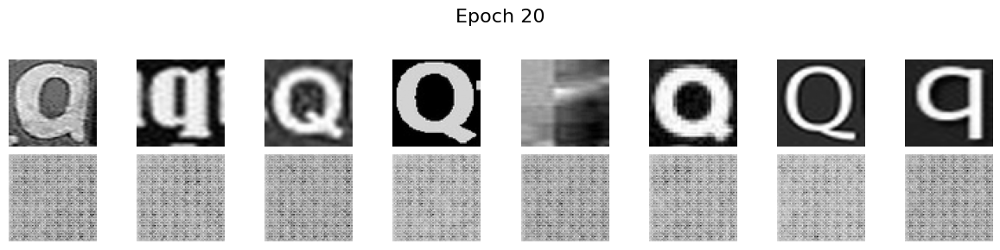

2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 3s/step - kl_loss: 0.0078 - reconstruction_loss: 2833.7500 - total_loss: 2833.7578   
Epoch 21/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - kl_loss: 0.0101 - reconstruction_loss: 2833.5999 - total_loss: 2833.6099
Epoch 22/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - kl_loss: 0.0129 - reconstruction_loss: 2833.3464 - total_loss: 2833.3594
Epoch 23/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - kl_loss: 0.0166 - reconstruction_loss: 2832.7415 - total_loss: 2832.7581
Epoch 24/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - kl_loss: 0.0213 - reconstruction_loss: 2832.3704 - total_loss: 2832.3918 
Epoch 25/70
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 642ms/step - kl_loss: 0.0263 - reconstruction_loss: 2831.5867 - total_loss: 2831.6130

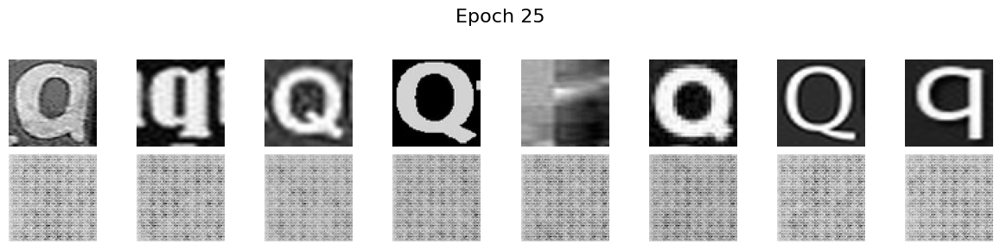

2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 3s/step - kl_loss: 0.0278 - reconstruction_loss: 2831.9678 - total_loss: 2831.9954   
Epoch 26/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - kl_loss: 0.0360 - reconstruction_loss: 2831.2727 - total_loss: 2831.3088
Epoch 27/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - kl_loss: 0.0460 - reconstruction_loss: 2831.3298 - total_loss: 2831.3757
Epoch 28/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - kl_loss: 0.0589 - reconstruction_loss: 2830.0459 - total_loss: 2830.1047
Epoch 29/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - kl_loss: 0.0782 - reconstruction_loss: 2829.5054 - total_loss: 2829.5833 
Epoch 30/70
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 652ms/step - kl_loss: 0.0945 - reconstruction_loss: 2828.8459 - total_loss: 2828.9404

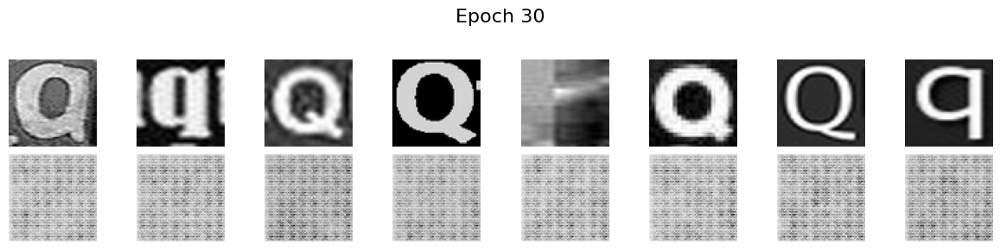

2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 3s/step - kl_loss: 0.1062 - reconstruction_loss: 2828.7495 - total_loss: 2828.8555   
Epoch 31/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - kl_loss: 0.1397 - reconstruction_loss: 2827.9617 - total_loss: 2828.1013
Epoch 32/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - kl_loss: 0.1837 - reconstruction_loss: 2827.2822 - total_loss: 2827.4661
Epoch 33/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - kl_loss: 0.2358 - reconstruction_loss: 2825.7791 - total_loss: 2826.0149 
Epoch 34/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - kl_loss: 0.2911 - reconstruction_loss: 2825.0994 - total_loss: 2825.3906 
Epoch 35/70
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 618ms/step - kl_loss: 0.3593 - reconstruction_loss: 2828.2600 - total_loss: 2828.6194

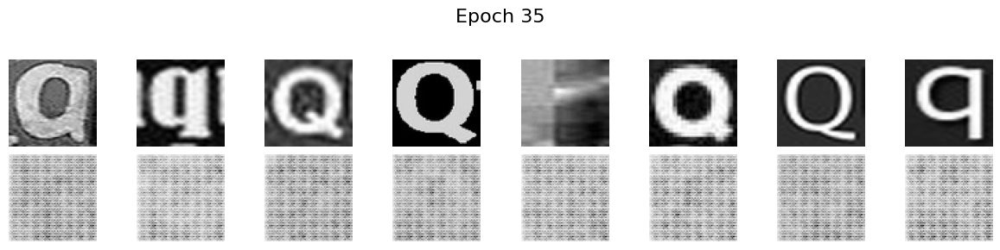

2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 3s/step - kl_loss: 0.3549 - reconstruction_loss: 2824.1580 - total_loss: 2824.5132   
Epoch 36/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - kl_loss: 0.4542 - reconstruction_loss: 2822.5969 - total_loss: 2823.0510
Epoch 37/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - kl_loss: 0.6174 - reconstruction_loss: 2821.4431 - total_loss: 2822.0605
Epoch 38/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - kl_loss: 0.8345 - reconstruction_loss: 2818.3406 - total_loss: 2819.1750
Epoch 39/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - kl_loss: 1.1110 - reconstruction_loss: 2818.2185 - total_loss: 2819.3296 
Epoch 40/70
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 627ms/step - kl_loss: 1.4178 - reconstruction_loss: 2821.2788 - total_loss: 2822.6965

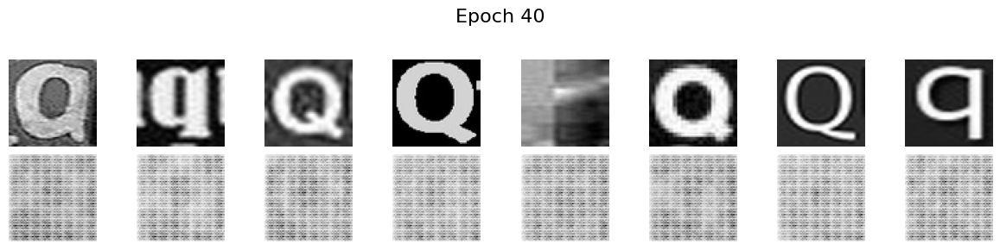

2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 3s/step - kl_loss: 1.5097 - reconstruction_loss: 2815.2083 - total_loss: 2816.7178   
Epoch 41/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - kl_loss: 1.9579 - reconstruction_loss: 2813.3503 - total_loss: 2815.3083
Epoch 42/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - kl_loss: 2.6303 - reconstruction_loss: 2809.5129 - total_loss: 2812.1431
Epoch 43/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - kl_loss: 3.7863 - reconstruction_loss: 2804.8970 - total_loss: 2808.6833
Epoch 44/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - kl_loss: 4.9596 - reconstruction_loss: 2801.0378 - total_loss: 2805.9973 
Epoch 45/70
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 610ms/step - kl_loss: 5.8009 - reconstruction_loss: 2800.8066 - total_loss: 2806.6077

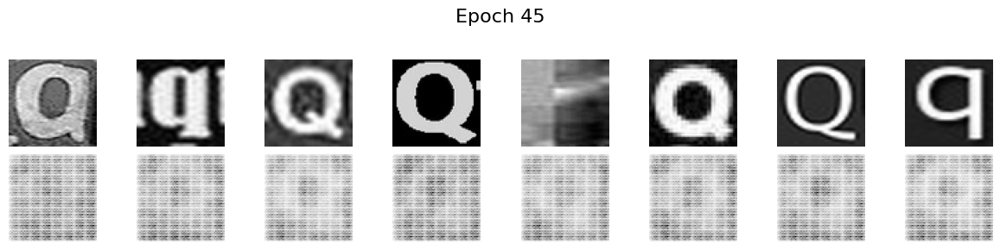

2/2 ━━━━━━━━━━━━━━━━━━━━ 7s 6s/step - kl_loss: 6.2066 - reconstruction_loss: 2793.4573 - total_loss: 2799.6638   
Epoch 46/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - kl_loss: 8.6994 - reconstruction_loss: 2787.6851 - total_loss: 2796.3845
Epoch 47/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - kl_loss: 11.9578 - reconstruction_loss: 2775.9529 - total_loss: 2787.9106
Epoch 48/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - kl_loss: 15.2348 - reconstruction_loss: 2762.1387 - total_loss: 2777.3735
Epoch 49/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - kl_loss: 17.4470 - reconstruction_loss: 2753.4006 - total_loss: 2770.8477
Epoch 50/70
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - kl_loss: 20.3443 - reconstruction_loss: 2737.8560 - total_loss: 2758.2002

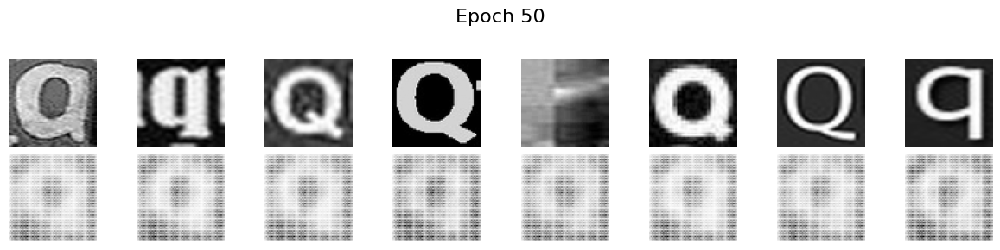

2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - kl_loss: 22.5132 - reconstruction_loss: 2728.7727 - total_loss: 2751.2856  
Epoch 51/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - kl_loss: 28.0071 - reconstruction_loss: 2709.3357 - total_loss: 2737.3425
Epoch 52/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - kl_loss: 33.9799 - reconstruction_loss: 2684.3601 - total_loss: 2718.3401
Epoch 53/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - kl_loss: 38.3564 - reconstruction_loss: 2663.5532 - total_loss: 2701.9097
Epoch 54/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - kl_loss: 39.4238 - reconstruction_loss: 2644.6465 - total_loss: 2684.0703 
Epoch 55/70
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 661ms/step - kl_loss: 46.2007 - reconstruction_loss: 2591.9312 - total_loss: 2638.1318

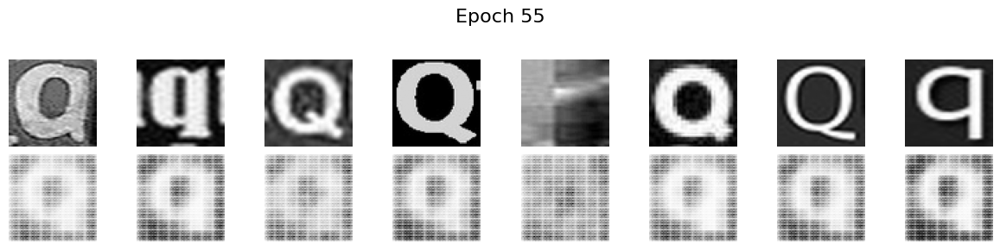

2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - kl_loss: 43.8031 - reconstruction_loss: 2622.6831 - total_loss: 2666.4861   
Epoch 56/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - kl_loss: 47.4927 - reconstruction_loss: 2600.3665 - total_loss: 2647.8591
Epoch 57/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - kl_loss: 48.0432 - reconstruction_loss: 2585.5227 - total_loss: 2633.5659
Epoch 58/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - kl_loss: 48.1589 - reconstruction_loss: 2571.1243 - total_loss: 2619.2832 
Epoch 59/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - kl_loss: 49.5156 - reconstruction_loss: 2557.6377 - total_loss: 2607.1533 
Epoch 60/70
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 649ms/step - kl_loss: 44.9716 - reconstruction_loss: 2572.6724 - total_loss: 2617.6440

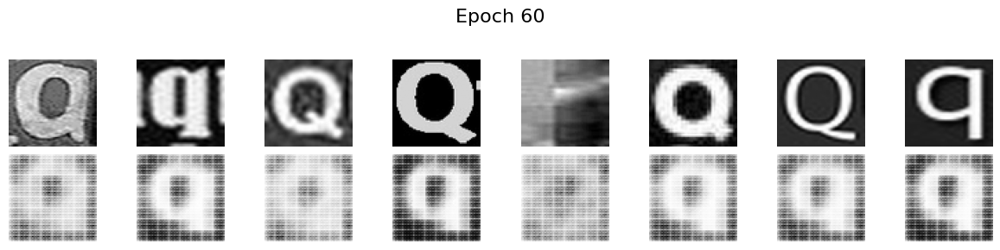

2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 2s/step - kl_loss: 49.9173 - reconstruction_loss: 2544.2136 - total_loss: 2594.1309   
Epoch 61/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - kl_loss: 49.6963 - reconstruction_loss: 2538.9797 - total_loss: 2588.6760
Epoch 62/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - kl_loss: 48.3030 - reconstruction_loss: 2527.3196 - total_loss: 2575.6226
Epoch 63/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - kl_loss: 44.5415 - reconstruction_loss: 2522.3159 - total_loss: 2566.8572 
Epoch 64/70
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - kl_loss: 46.0930 - reconstruction_loss: 2514.6431 - total_loss: 2560.7361 
Epoch 65/70
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 733ms/step - kl_loss: 45.6595 - reconstruction_loss: 2516.9585 - total_loss: 2562.6179

KeyboardInterrupt: 

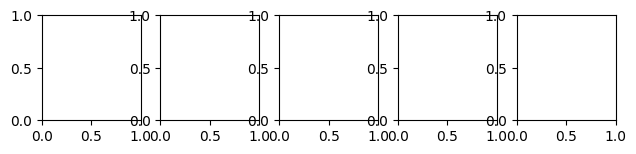

In [ ]:
# ============================================================
# CELDA 5: ENTRENAMIENTO - SEGUNDA MITAD (N-Z)
# ============================================================
import time
print("Iniciando entrenamiento de la SEGUNDA MITAD (N-Z)...")

# 1. Definir la lista de entrenamiento
num_letras_total = len(builder.info.features["label"].names)
mitad = math.ceil(num_letras_total / 2)
LETRAS_A_ENTRENAR_SEGUNDA_MITAD = builder.info.features["label"].names[mitad:]

# 2. Iniciar el bucle
for letter in LETRAS_A_ENTRENAR_SEGUNDA_MITAD:
    print(f"\n====================== INICIANDO ENTRENAMIENTO: {letter} ======================")
    start_time = time.time()

    target_label_int = get_label_int(letter)

    # 1. CONTEO y VERIFICACIÓN (Usa el 'ds' global)
    count = sum(1 for _ in ds.filter(lambda x, y: tf.equal(y, target_label_int)))

    if count < MIN_SAMPLES_FOR_TRAINING:
        print(f"⚠️ Saltando '{letter}': {count} ejemplos (Mínimo: {MIN_SAMPLES_FOR_TRAINING}).")
        continue

    # 2. CÁLCULO DINÁMICO DE STEPS
    STEPS_PER_EPOCH = math.ceil(count / BATCH_SIZE)

    # 3. Preparar Dataset (Usa 'ds' global)
    train_ds_letter = prepare_dataset_for_letter(ds, letter)

    # 4. OBTENER BATCH DE MUESTRA (Robusto)
    try:
        sample_batch = next(iter(train_ds_letter.unbatch().take(8).batch(8)))
        print(f"   (Total: {count} imágenes | Steps/Epoch: {STEPS_PER_EPOCH} | Epochs: {EPOCHS_PER_LETTER})")
    except Exception as e:
        print(f"❌ Falló la obtención del sample_batch para '{letter}': {e}. Saltando.")
        continue

    # 5. RE-INICIALIZAR MODELOS (Llama a las funciones de Celda 3)
    encoder = make_encoder_model()
    decoder = make_decoder_model()
    vae = VAE(encoder, decoder)

    # 6. Compilar y Entrenar
    vae.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4))
    print(f"🔹 Entrenando VAE para la letra '{letter}'...")

    vae.fit(
        train_ds_letter,
        epochs=EPOCHS_PER_LETTER,
        steps_per_epoch=STEPS_PER_EPOCH,
        callbacks=[VisualCallback(sample_batch, save_dir=f"/content/outputs/{letter}")],
        verbose=1
    )

    # 7. Guardar los modelos entrenados
    decoder.save(os.path.join(MODEL_DIR, f"decoder_{letter}.keras"))
    encoder.save(os.path.join(MODEL_DIR, f"encoder_{letter}.keras"))

    end_time = time.time()
    print(f"✅ Letra '{letter}' completada en {((end_time - start_time) / 60):.2f} minutos.")

print("\n🎉🎉 ENTRENAMIENTO COMPLETO DE TODAS LAS LETRAS (A-Z).")

In [ ]:
# ============================================================
# CELDA 6: CONVERSIÓN A TENSORFLOW.JS Y DESCARGA
# ============================================================
import zipfile
import subprocess
from google.colab import files

print("--- 1. Instalando TensorFlow.js Converter ---")
!pip install tensorflowjs -q

# Rutas (MODEL_DIR debe coincidir con la Celda 3)
TFJS_DIR = "/content/tfjs_models_final"
os.makedirs(TFJS_DIR, exist_ok=True)
ZIP_FILE = "/content/tfjs_models_for_github.zip"

print(f"--- 2. Convirtiendo modelos de {MODEL_DIR} a {TFJS_DIR} ---")
print("-" * 50)

# Iterar y convertir
model_files = [f for f in os.listdir(MODEL_DIR) if f.endswith(".keras")]
if not model_files:
    print(f"❌ ADVERTENCIA: No se encontraron archivos .keras en {MODEL_DIR}. ¿Se completó el entrenamiento?")

for filename in model_files:
    keras_path = os.path.join(MODEL_DIR, filename)
    # Nombre de carpeta TFJS, ej: "decoder_A"
    base_name = filename.replace(".keras", "")
    tfjs_output_path = os.path.join(TFJS_DIR, base_name)

    command = [
        "tensorflowjs_converter",
        "--input_format=keras",
        "--output_format=tfjs_graph_model",
        keras_path,
        tfjs_output_path
    ]

    try:
        subprocess.run(command, check=True, capture_output=True, text=True)
        print(f"✅ Convertido: {filename} -> {base_name}/")
    except subprocess.CalledProcessError as e:
        print(f"❌ ERROR al convertir {filename}:\n{e.stderr}")

print("-" * 50)

# 3. Comprimir los Modelos Convertidos
print(f"--- 3. Comprimiendo {TFJS_DIR} en {ZIP_FILE} ---")

with zipfile.ZipFile(ZIP_FILE, 'w', zipfile.ZIP_DEFLATED) as zipf:
    for root, dirs, files_to_zip in os.walk(TFJS_DIR):
        for file in files_to_zip:
            file_path = os.path.join(root, file)
            # Ruta relativa para el ZIP (ej: "decoder_A/model.json")
            arcname = os.path.relpath(file_path, TFJS_DIR)
            zipf.write(file_path, arcname)

print("✅ Compresión completada.")
print("-" * 50)

# 4. Descarga
print("🚀 Iniciando descarga del archivo ZIP. ¡Listo para GitHub!")
files.download(ZIP_FILE)